<a href="https://colab.research.google.com/github/bryantchakote/image_cartoonizer/blob/main/Image_to_cartoon_translation_with_a_conditional_GAN_(pix2pix).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Image-to-cartoon translation with a conditional GAN (pix2pix)**

**Team Members:**

- Adetutu Uwanikone (PGE 5)
- Bryan Tchakote (PGE 4)
- Daniela Wouelebak (PGE 4)
- Franck Tchouanga (PGE 5)

## **Data loading and preprocessing** 

### **Import TensorFlow and other libraries**

In [1]:
import tensorflow as tf
import numpy as np

import os
import pathlib
import time
import datetime

from matplotlib import pyplot as plt
from IPython import display

### **Load the dataset**

In [2]:
!git clone -q https://github.com/bryantchakote/image_cartoonizer.git

In [3]:
PATH = pathlib.Path('image_cartoonizer/data')

Each original image is of size `256 x 512` containing two `256 x 256` horizontally-stacked images: the ground truth input on the left, and the cartoonized output on the right.

In [4]:
image_file = np.random.choice(os.listdir(PATH / 'train'))
image_file = '1.jpg' #
sample_image = tf.io.read_file(str(PATH / f'train/{image_file}'))
sample_image = tf.io.decode_jpeg(sample_image)
print(image_file, sample_image.shape)

1.jpg (256, 512, 3)


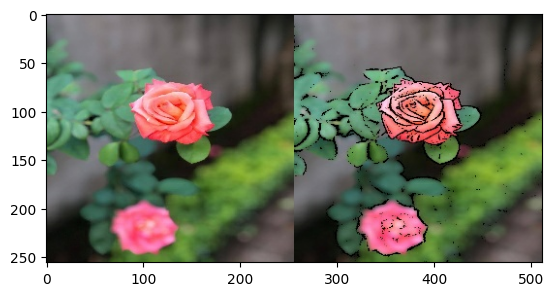

In [5]:
plt.imshow(sample_image)
plt.show()

### **Separate ground truth images from the cartoonized ones**

In [6]:
def load(image_file):
  # Read and decode an image file to a uint8 tensor
  image = tf.io.read_file(image_file)
  image = tf.io.decode_jpeg(image)

  # Split each image tensor into two tensors: the real input and its cartoonized equivalent
  w = tf.shape(image)[1]
  w = w // 2
  groundtruth_image = image[:, :w, :]
  cartoonized_image = image[:, w:, :]

  # Convert both images to float32 tensors
  groundtruth_image = tf.cast(groundtruth_image, tf.float32)
  cartoonized_image = tf.cast(cartoonized_image, tf.float32)

  return groundtruth_image, cartoonized_image

Display a sample of the real image and the cartoonized equivalent:

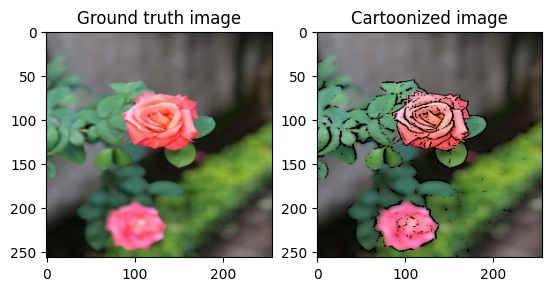

In [7]:
groundtruth_image, cartoonized_image = load(str(PATH / f'train/{image_file}'))

# Casting to int for matplotlib to display the images
plt.subplot(1, 2, 1)
plt.imshow(groundtruth_image / 255.0)
plt.title('Ground truth image')

plt.subplot(1, 2, 2)
plt.imshow(cartoonized_image / 255.0)
plt.title('Cartoonized image')

plt.show()

### **Apply random jittering and mirroring to preprocess the training set**

1. Resize each `256 x 256` image to a larger height and width: `286 x 286`.
2. Randomly crop it back to `256 x 256`.
3. Randomly flip the image horizontally i.e. left to right (random mirroring).
4. Normalize the images to the `[-1, 1]` range.

In [8]:
# Training set length
BUFFER_SIZE = len(os.listdir(PATH / 'train'))
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [9]:
def resize(groundtruth_image, cartoonized_image, height, width):
  groundtruth_image = tf.image.resize(groundtruth_image, [height, width],
                                      method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  cartoonized_image = tf.image.resize(cartoonized_image, [height, width],
                                      method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return groundtruth_image, cartoonized_image

In [10]:
def random_crop(groundtruth_image, cartoonized_image):
  stacked_image = tf.stack([groundtruth_image, cartoonized_image], axis=0)
  cropped_image = tf.image.random_crop(stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

In [11]:
@tf.function()
def random_jitter(groundtruth_image, cartoonized_image):
  # Resizing to 286x286
  groundtruth_image, cartoonized_image = resize(groundtruth_image, cartoonized_image, 286, 286)

  # Random cropping back to 256x256
  groundtruth_image, cartoonized_image = random_crop(groundtruth_image, cartoonized_image)

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    groundtruth_image = tf.image.flip_left_right(groundtruth_image)
    cartoonized_image = tf.image.flip_left_right(cartoonized_image)

  return groundtruth_image, cartoonized_image

In [12]:
# Normalizing the images to [-1, 1]
def normalize(groundtruth_image, cartoonized_image):
  groundtruth_image = (groundtruth_image / 127.5) - 1
  cartoonized_image = (cartoonized_image / 127.5) - 1

  return groundtruth_image, cartoonized_image

Inspect a preprocessed output:

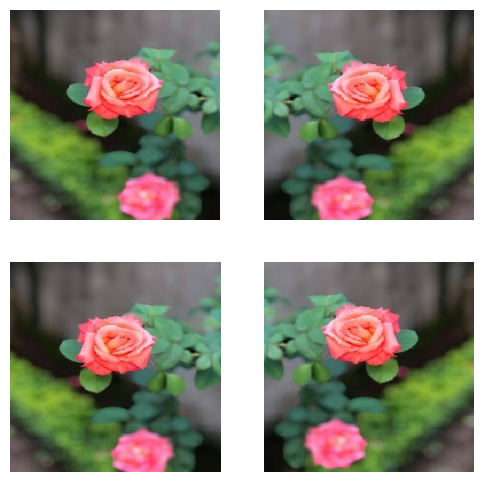

In [13]:
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_groundtruth, rj_cartoon = random_jitter(groundtruth_image, cartoonized_image)
  plt.subplot(2, 2, i + 1)
  plt.imshow(rj_groundtruth / 255.0)
  plt.axis('off')
plt.show()

### **Define a couple of helper functions that load and preprocess the training and test sets**

In [14]:
def load_image_train(image_file):
  groundtruth_image, cartoonized_image = load(image_file)
  groundtruth_image, cartoonized_image = random_jitter(groundtruth_image, cartoonized_image)
  groundtruth_image, cartoonized_image = normalize(groundtruth_image, cartoonized_image)

  return groundtruth_image, cartoonized_image

In [15]:
def load_image_test(image_file):
  groundtruth_image, cartoonized_image = load(image_file)
  # Test images don't need random jitter
  groundtruth_image, cartoonized_image = resize(groundtruth_image, cartoonized_image,
                                         IMG_HEIGHT, IMG_WIDTH)
  groundtruth_image, cartoonized_image = normalize(groundtruth_image, cartoonized_image)

  return groundtruth_image, cartoonized_image

### **Build an input pipeline with `tf.data`**

In [16]:
train_dataset = tf.data.Dataset.list_files(str(PATH / 'train/*.jpg'))
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [17]:
test_dataset = tf.data.Dataset.list_files(str(PATH / 'test/*.jpg'))
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

## **Generator, Discriminator, Optimizers, and Checkpoint-saver**

### **Generator**

#### **Build the generator**

The generator of pix2pix cGAN is a modified [U-Net](https://arxiv.org/abs/1505.04597). A U-Net consists of an encoder (downsampler) and decoder (upsampler).

- Each block in the encoder is: Convolution -> Batch normalization -> Leaky ReLU
- Each block in the decoder is: Transposed convolution -> Batch normalization -> Dropout (applied to the first 3 blocks) -> ReLU
- There are skip connections between the encoder and decoder (as in the U-Net).

Define the downsampler (encoder):

In [18]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(mean=0., stddev=.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                           kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

Define the upsampler (decoder):

In [19]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(mean=0., stddev=.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(.5))

  result.add(tf.keras.layers.ReLU())

  return result

Define the generator with the downsampler and the upsampler:

In [20]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256, 3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(mean=0., stddev=.02)
  last = tf.keras.layers.Conv2DTranspose(3, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

Visualize the generator model architecture:

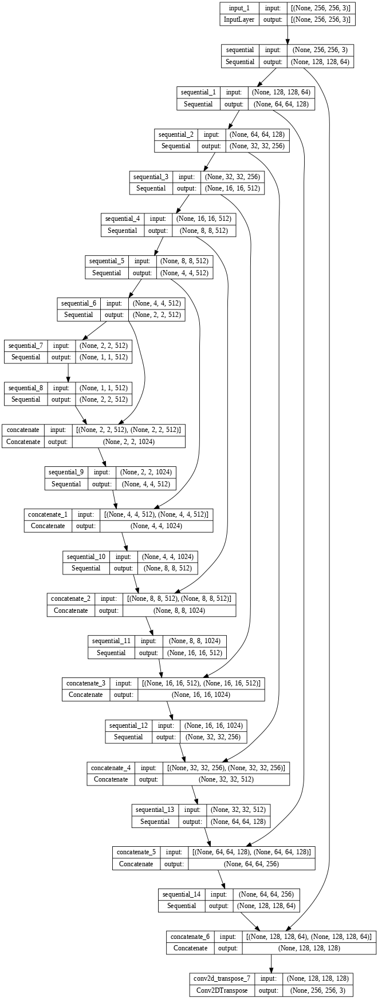

In [21]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

Test the generator:

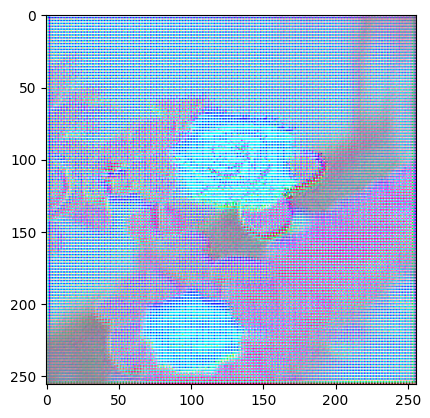

In [22]:
gen_output = generator(tf.expand_dims(groundtruth_image, 0), training=False)
plt.imshow(tf.squeeze(gen_output * 0.5 + 0.5)) # getting pixel values within [0, 1]
plt.show()

#### **Define the generator loss**

The total generator loss is a combination of:
- a L1 loss, which is a mean-absolute error (or MAE) between the generated images and the target ones, and
- a sigmoid cross-entropy loss of (a) the generated images and (b) an array of ones. Actually, not the images themselves are used, but the **discriminator result or embedding**, which is a `30 x 30` array representing an image "realness", or in this case, "cartoonizedness" (this word doesn't exist!). Hence the use of ones-like array for comparison.

This allows the generated image to become structurally similar to the target image. The formula to calculate the total generator loss is `cross_entropy_loss + LAMBDA * l1_loss`, where `LAMBDA = 100` (this value was decided by the authors of the paper).

In [23]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [24]:
def generator_loss(disc_generated_output, gen_output, target, LAMBDA=100):
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
  cross_entropy_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
  gen_loss = (LAMBDA * l1_loss) + cross_entropy_loss

  return gen_loss, l1_loss, cross_entropy_loss

The training procedure for the generator is as follows:

![Generator Update Image](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/gen.png?raw=1)


### **Discriminator**

#### **Build the discriminator**

The discriminator is a convolutional PatchGAN classifier. It tries to classify if each image "patch" is real or cartoonized.

- Each block in the discriminator model's structure is: Convolution -> Batch normalization -> Leaky ReLU.
- The shape of the output after the last layer is `(batch_size, 30, 30, 1)`.
- Each `30 x 30` image patch of the output classifies a `70 x 70` portion of the input image (the so-called receptive field).
- The discriminator receives 2 inputs: a groundtruth image and a target (either the generator output or the cartoonized equivalent; actually we need to use both of them as we're going to see later in the training process...)

Let's define the discriminator:

In [25]:
def Discriminator():
  initializer = tf.random_normal_initializer(mean=0., stddev=.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='groundtruth_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='cartoonized_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, 3*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

Visualize the discriminator model architecture:

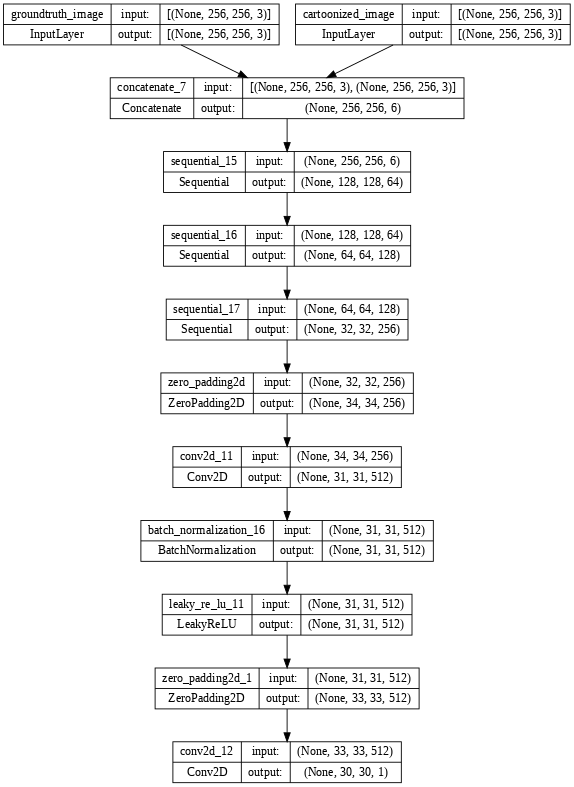

In [26]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

Test the discriminator:

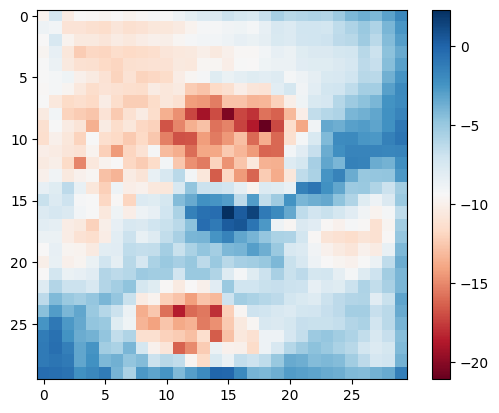

In [27]:
disc_out = discriminator([tf.expand_dims(groundtruth_image, 0), gen_output], training=False)
plt.imshow(tf.squeeze(disc_out), cmap='RdBu')
plt.colorbar()
plt.show()

#### **Define the discriminator loss**

- The discriminator loss function takes two discriminator outputs (or embeddings) as input: that of cartoonized images and that of a generated ones.
- `generated_loss` is a sigmoid cross-entropy loss of (a) **generated images embeddings** and (b) an **array of ZEROS** (since these are fake cartoonized  images).
- `cartoonized_loss` is a sigmoid cross-entropy loss of (a) **cartoonized images embeddings** and (b) an **array of ONES** (since these are real cartoonized images).
- The `total_loss` is the sum of the `generated_loss` and `cartoonized_loss`.

In [28]:
def discriminator_loss(disc_generated_output, disc_cartoonized_output):
  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)
  cartoonized_loss = loss_object(tf.ones_like(disc_cartoonized_output), disc_cartoonized_output)
  disc_loss = generated_loss + cartoonized_loss

  return disc_loss

The training procedure for the discriminator is shown below.

![Discriminator Update Image](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/dis.png?raw=1)


### **Optimizers and checkpoint-saver**


In [29]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=.5)

In [30]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, 'ckpt')
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## **Training**

- For each input image, generate an output.
- The discriminator first receives the real input image and the generated one, then the same input image and the cartoonized target.
- Next, calculate the generator and the discriminator loss.
- Then, calculate the gradients of loss with respect to both the generator and the discriminator variables (inputs) and apply those to the optimizer.

In [31]:
log_dir = 'logs/'
summary_writer = tf.summary.create_file_writer(log_dir + 'fit/' + datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))

In [32]:
@tf.function
def train_step(groundtruth_image, cartoonized_image, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_image = generator(groundtruth_image, training=True)

    disc_generated_output = discriminator([groundtruth_image, generated_image], training=True)
    disc_cartoonized_output = discriminator([groundtruth_image, cartoonized_image], training=True)

    gen_loss, gen_l1_loss, gen_cross_entropy_loss = generator_loss(disc_generated_output, generated_image, cartoonized_image)
    disc_loss = discriminator_loss(disc_generated_output, disc_cartoonized_output)

  generator_gradients = gen_tape.gradient(gen_loss, generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_loss', gen_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('gen_cross_entropy_loss', gen_cross_entropy_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

A function to plot some images during training:

In [33]:
def generate_and_plot_images(model, groundtruth_image, cartoonized_image):
  predicted_image = model(groundtruth_image, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [groundtruth_image[0], cartoonized_image[0], predicted_image[0]]
  title = ['Ground truth', 'Cartoonized', 'Predicted']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    plt.imshow(display_list[i] * 0.5 + 0.5) # getting pixel values within [0, 1]
    plt.axis('off')
  plt.show()

The actual training loop:

- Every 10 steps print a dot (`.`).
- Every 1k steps: clear the display and run `generate_images` to show the progress.
- Every 5k steps: save a checkpoint.

In [34]:
def fit(train_ds, test_ds, steps):
  groundtruth_image_example, cartoonized_image_example = next(iter(test_ds.take(1)))
  start = time.time()

  for step, (groundtruth_image, cartoonized_image) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time() - start:.2f} sec\n')

      start = time.time()

      generate_and_plot_images(generator, groundtruth_image_example, cartoonized_image_example)
      print(f"Step: {step//1000}k")

    train_step(groundtruth_image, cartoonized_image, step)

    # Training step
    if (step + 1) % 10 == 0:
      print('.', end='', flush=True)

    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

This training loop saves logs that you can be viewed in TensorBoard to monitor the training progress.

Finally, run the training loop:

Time taken for 1000 steps: 88.46 sec



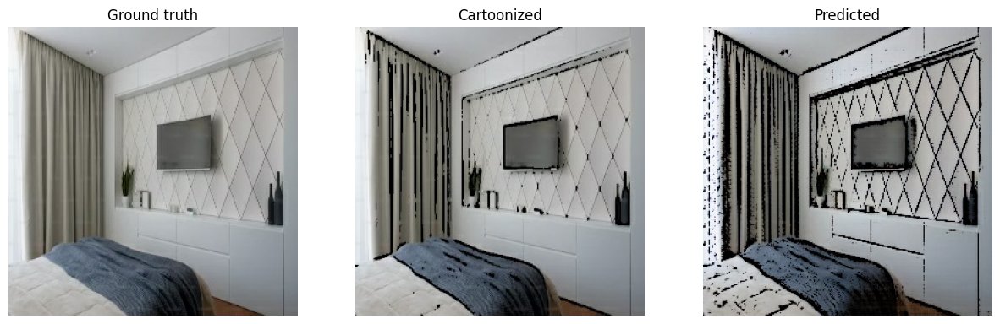

Step: 29k
....................................................................................................

In [36]:
fit(train_dataset, test_dataset, steps=30000)

## **Restore the latest checkpoint and test the network**

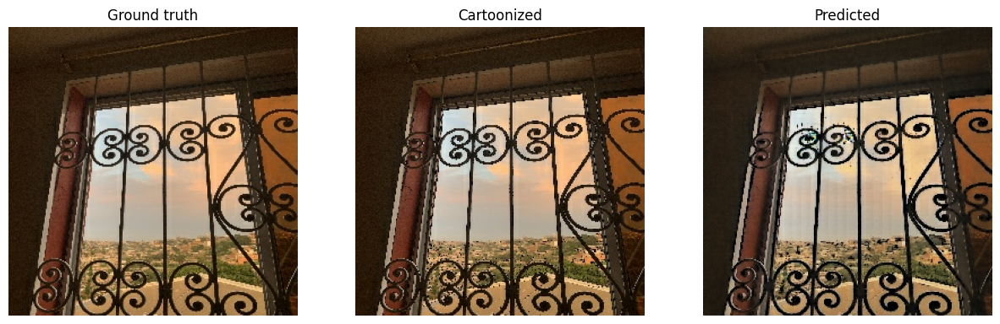

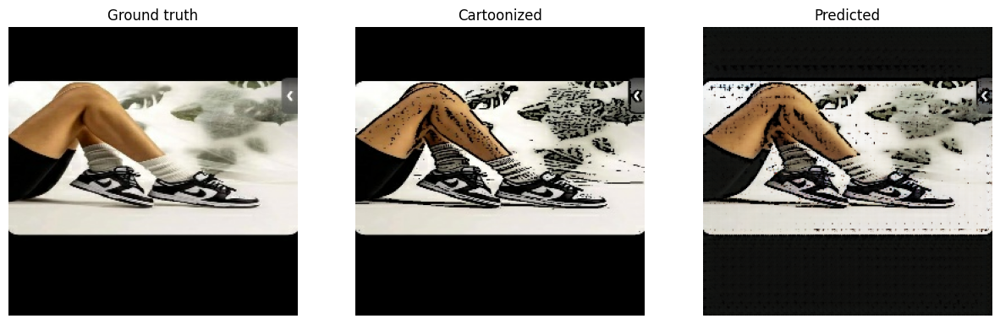

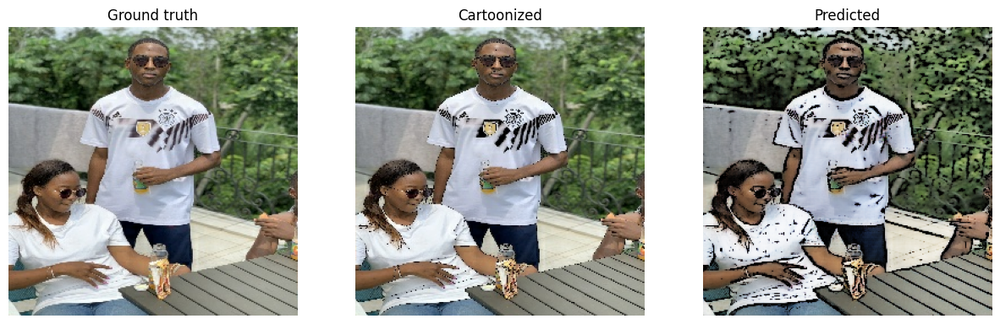

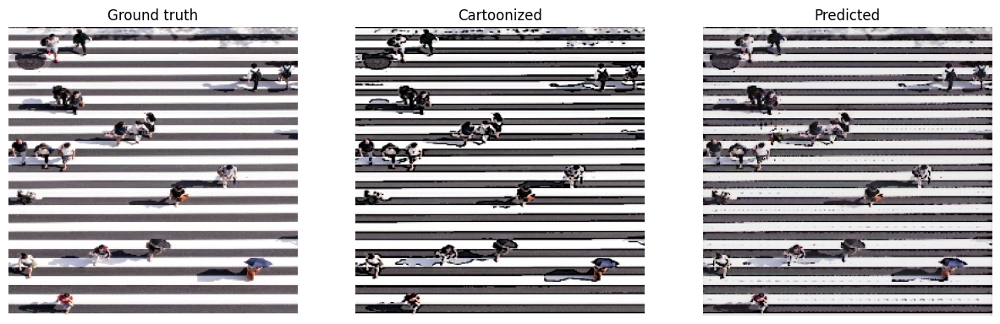

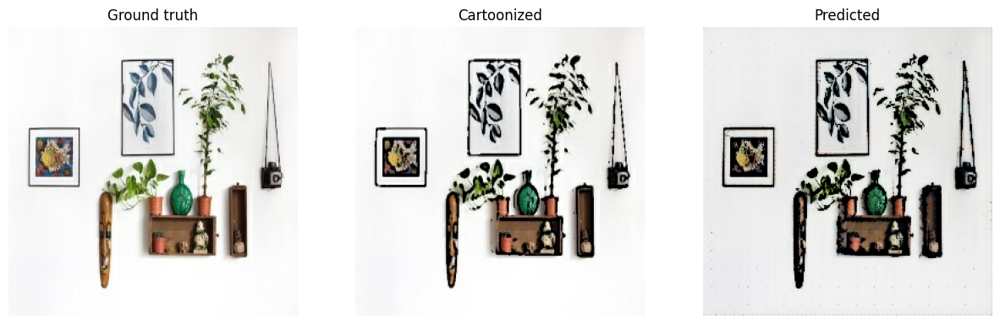

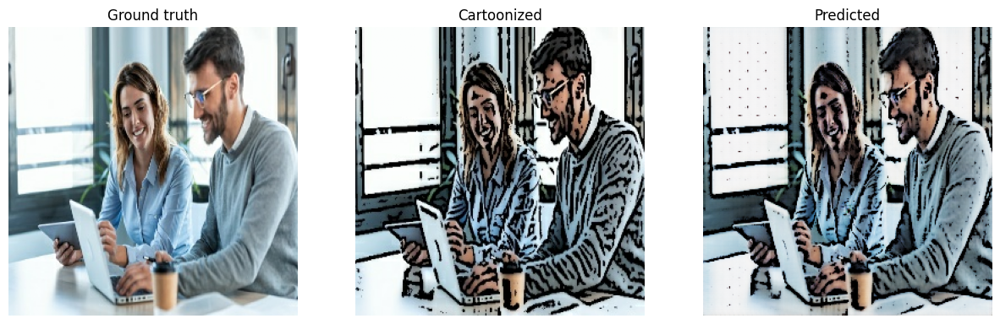

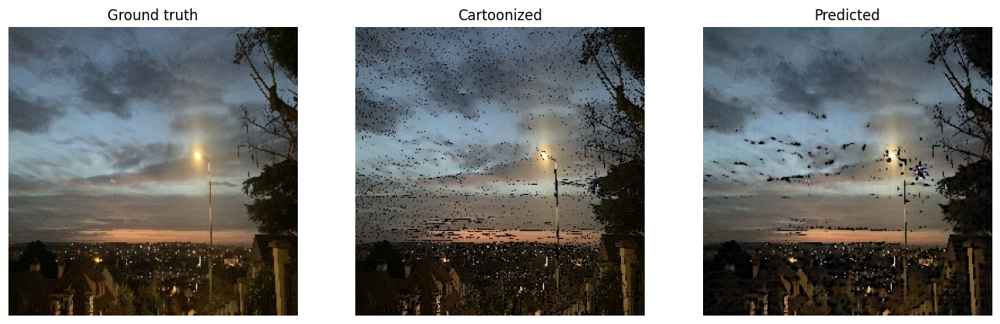

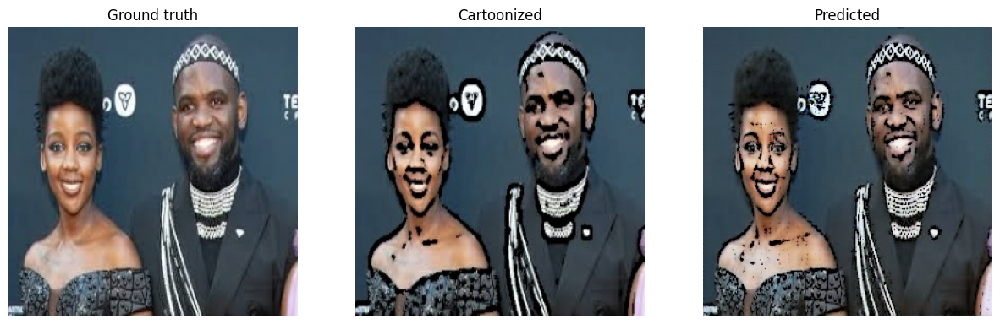

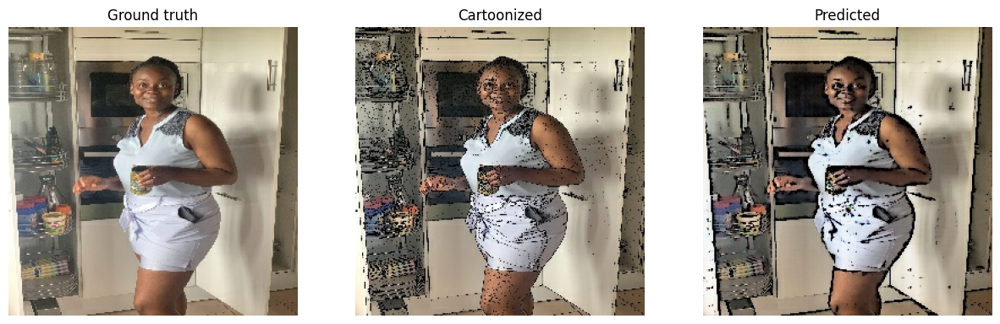

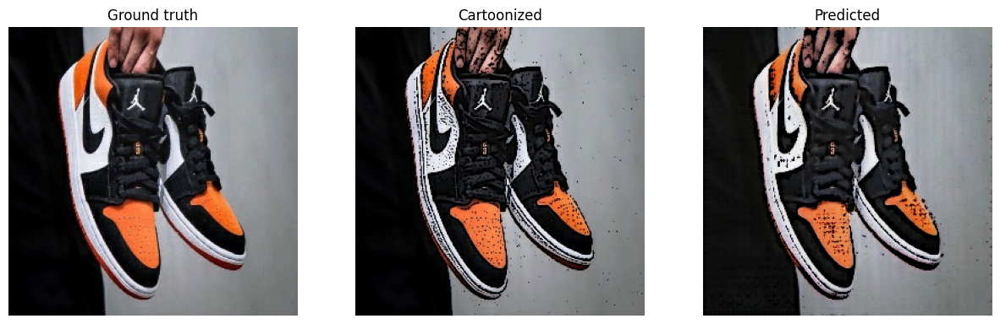

In [37]:
# Restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

# Run the trained model on a few examples from the test set
for groundtruth_image, cartoonized_image in test_dataset.take(10):
  generate_and_plot_images(generator, groundtruth_image, cartoonized_image)